## Análise exploratória de dados

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import csv
import matplotlib.pyplot as plt
from sklearn import linear_model

In [2]:
df = pd.read_csv('baseball.csv')
df.head()

,Team,League,Year,RS,RA,W,OBP,SLG,BA,Playoffs,RankSeason,RankPlayoffs,G,OOBP,OSLG
0,ARI,NL,2012,734,688,81,0.328,0.418,0.259,0,NaN,NaN,162,0.317,0.415
1,ATL,NL,2012,700,600,94,0.320,0.389,0.247,1,4.0,5.0,162,0.306,0.378
2,BAL,AL,2012,712,705,93,0.311,0.417,0.247,1,5.0,4.0,162,0.315,0.403
3,BOS,AL,2012,734,806,69,0.315,0.415,0.260,0,NaN,NaN,162,0.331,0.428
4,CHC,NL,2012,613,759,61,0.302,0.378,0.240,0,NaN,NaN,162,0.335,0.424


In [3]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,1232.0,1988.957792,14.819625,1962.000,1976.750,1989.000,2002.000,2012.000
RS,1232.0,715.081981,91.534294,463.000,652.000,711.000,775.000,1009.000
RA,1232.0,715.081981,93.079933,472.000,649.750,709.000,774.250,1103.000
W,1232.0,80.904221,11.458139,40.000,73.000,81.000,89.000,116.000
OBP,1232.0,0.326331,0.015013,0.277,0.317,0.326,0.337,0.373
SLG,1232.0,0.397342,0.033267,0.301,0.375,0.396,0.421,0.491
BA,1232.0,0.259273,0.012907,0.214,0.251,0.260,0.268,0.294
Playoffs,1232.0,0.198052,0.398693,0.000,0.000,0.000,0.000,1.000
RankSeason,244.0,3.122951,1.738349,1.000,2.000,3.000,4.000,8.000
RankPlayoffs,244.0,2.717213,1.095234,1.000,2.000,3.000,4.000,5.000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1232 entries, 0 to 1231
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Team          1232 non-null   object 
 1   League        1232 non-null   object 
 2   Year          1232 non-null   int64  
 3   RS            1232 non-null   int64  
 4   RA            1232 non-null   int64  
 5   W             1232 non-null   int64  
 6   OBP           1232 non-null   float64
 7   SLG           1232 non-null   float64
 8   BA            1232 non-null   float64
 9   Playoffs      1232 non-null   int64  
 10  RankSeason    244 non-null    float64
 11  RankPlayoffs  244 non-null    float64
 12  G             1232 non-null   int64  
 13  OOBP          420 non-null    float64
 14  OSLG          420 non-null    float64
dtypes: float64(7), int64(6), object(2)
memory usage: 144.5+ KB


In [5]:
df.isna().sum()

Team              0
League            0
Year              0
RS                0
RA                0
W                 0
OBP               0
SLG               0
BA                0
Playoffs          0
RankSeason      988
RankPlayoffs    988
G                 0
OOBP            812
OSLG            812
dtype: int64

In [6]:
df_filled = df.fillna(df.mean(numeric_only=True))

In [10]:
df_dropped = df.dropna(subset=['RankSeason', 'RankPlayoffs', 'OOBP', 'OSLG'], axis=0)

In [13]:
df_dropped['Playoffs'].value_counts()

1    114
Name: Playoffs, dtype: int64

In [15]:
df['Playoffs'].value_counts()

0    988
1    244
Name: Playoffs, dtype: int64

In [14]:
df_filled['Playoffs'].value_counts()

0    988
1    244
Name: Playoffs, dtype: int64

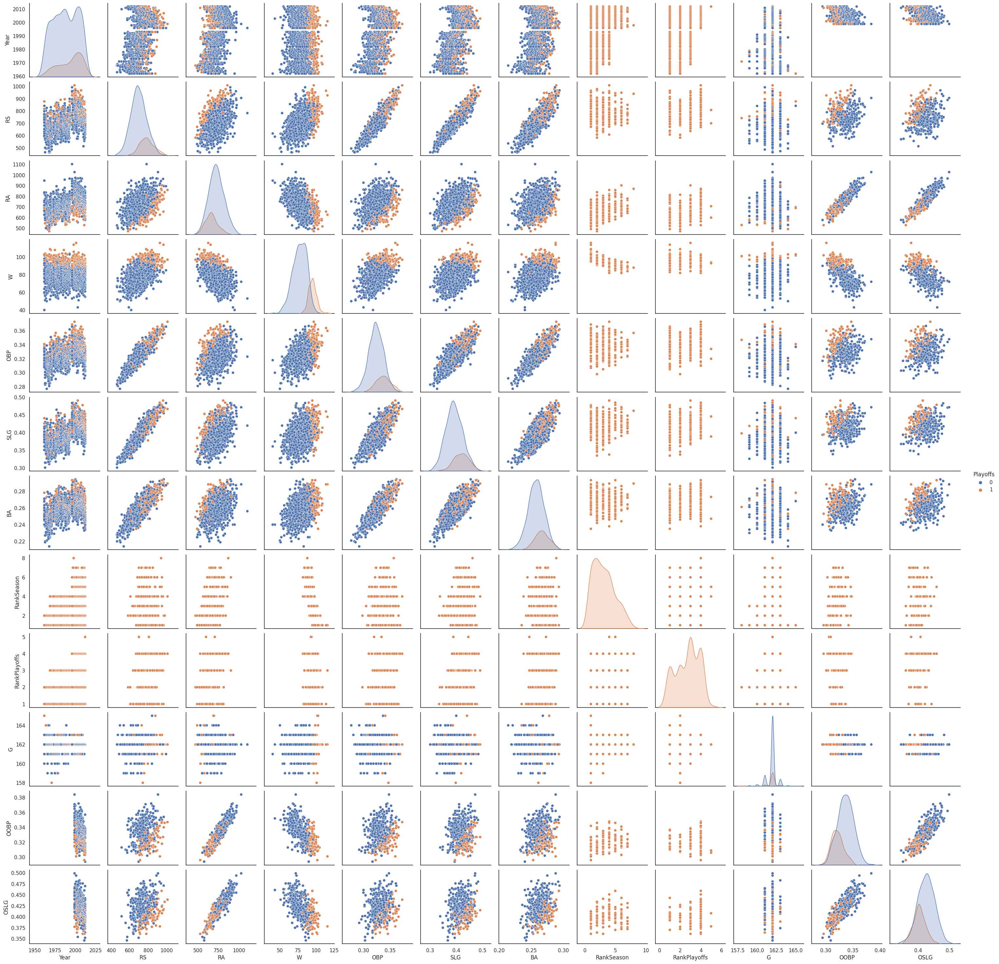

In [296]:
sns.pairplot(df, hue='Playoffs');

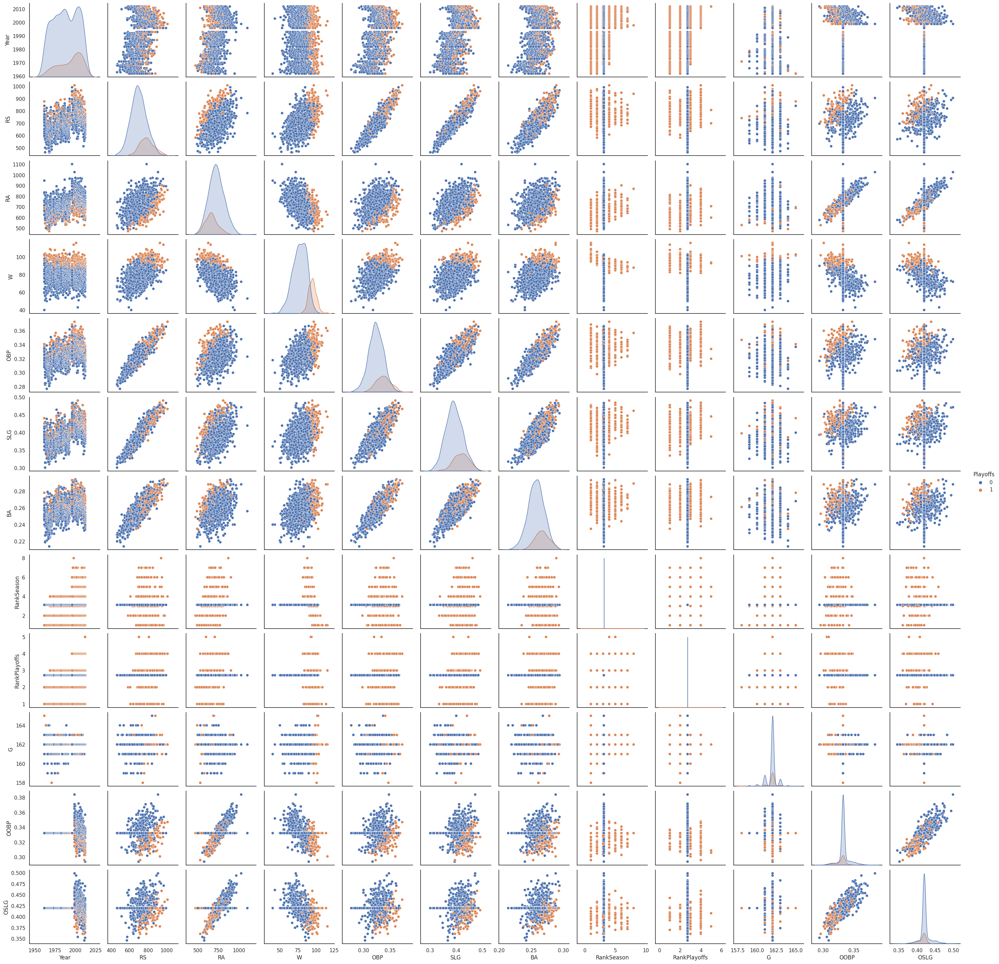

In [297]:
sns.pairplot(df_filled, hue='Playoffs');

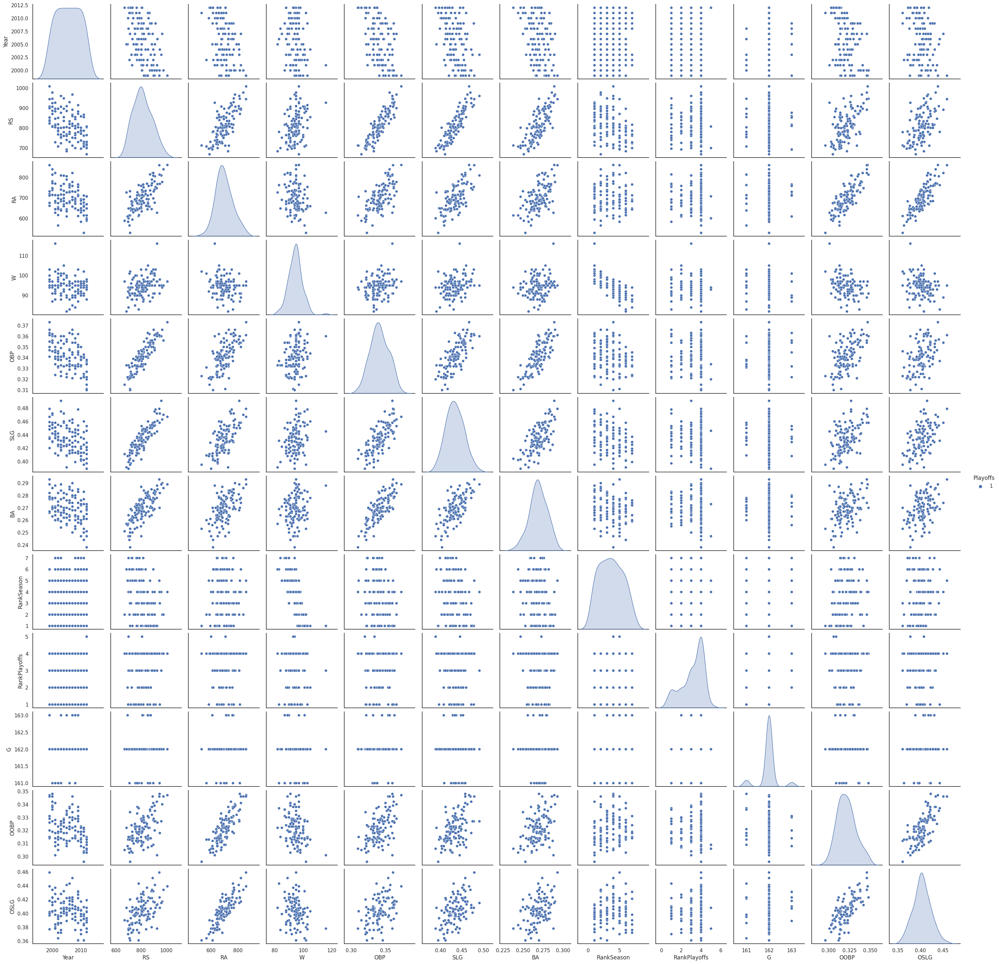

In [298]:
sns.pairplot(df_dropped, hue='Playoffs');

In [299]:
selected_cols = ['RS', 'RA', 'W', 'OBP', 'SLG', 'BA',
                    'RankSeason', 'RankPlayoffs', 'G', 'OOBP', 'OSLG']

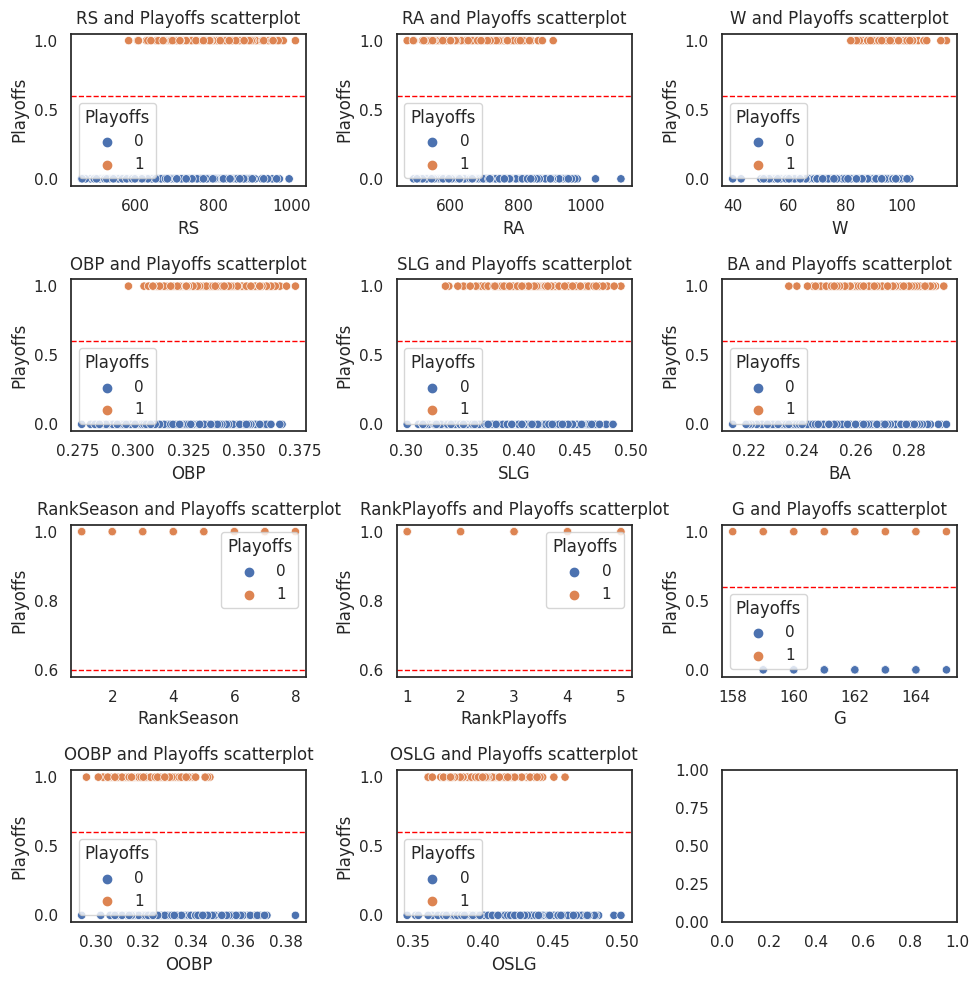

In [300]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(10,10))
fig.subplots_adjust(wspace=0.5, hspace=0.5)

for ax, x in zip(axes.flatten(), selected_cols):
    sns.scatterplot(x=x, ax=ax, y='Playoffs', data=df, hue='Playoffs')
    ax.axhline(0.6, ls='--', linewidth=1, color='red')
    ax.set_title(f'{x} and Playoffs scatterplot', pad=7)
    plt.tight_layout()

In [303]:
df_dropped

,Team,League,Year,RS,RA,W,OBP,SLG,BA,Playoffs,RankSeason,RankPlayoffs,G,OOBP,OSLG
1,ATL,NL,2012,700,600,94,0.320,0.389,0.247,1,4.0,5.0,162,0.306,0.378
2,BAL,AL,2012,712,705,93,0.311,0.417,0.247,1,5.0,4.0,162,0.315,0.403
6,CIN,NL,2012,669,588,97,0.315,0.411,0.251,1,2.0,4.0,162,0.305,0.390
9,DET,AL,2012,726,670,88,0.335,0.422,0.268,1,6.0,2.0,162,0.314,0.402
18,NYY,AL,2012,804,668,95,0.337,0.453,0.265,1,3.0,3.0,162,0.311,0.419
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
398,CLE,AL,1999,1009,860,97,0.373,0.467,0.289,1,4.0,4.0,162,0.347,0.439
402,HOU,NL,1999,823,675,97,0.355,0.420,0.267,1,4.0,4.0,162,0.326,0.397
408,NYM,NL,1999,853,711,97,0.363,0.434,0.279,1,4.0,3.0,163,0.331,0.418
409,NYY,AL,1999,900,731,98,0.366,0.453,0.282,1,3.0,1.0,162,0.329,0.400


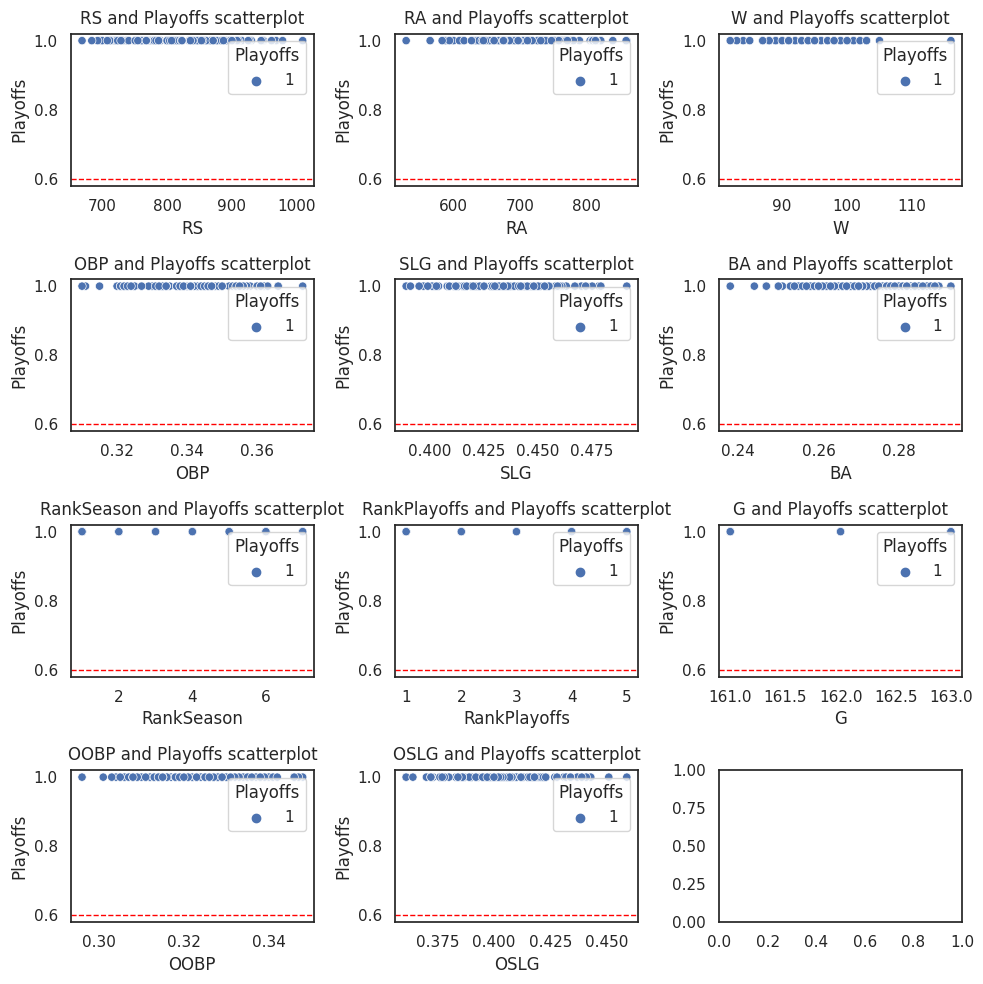

In [301]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(10,10))
fig.subplots_adjust(wspace=0.5, hspace=0.5)

for ax, x in zip(axes.flatten(), selected_cols):
    sns.scatterplot(x=x, ax=ax, y='Playoffs', data='df_dropped', hue='Playoffs')
    ax.axhline(0.6, ls='--', linewidth=1, color='red')
    ax.set_title(f'{x} and Playoffs scatterplot', pad=7)
    plt.tight_layout()

RS 715.0819805194806
RA 715.0819805194806
W 80.90422077922078
OBP 0.32633116883116886
SLG 0.39734172077922075
BA 0.25927272727272727
RankSeason nan
RankPlayoffs nan
G 161.91883116883116
OOBP nan
OSLG nan


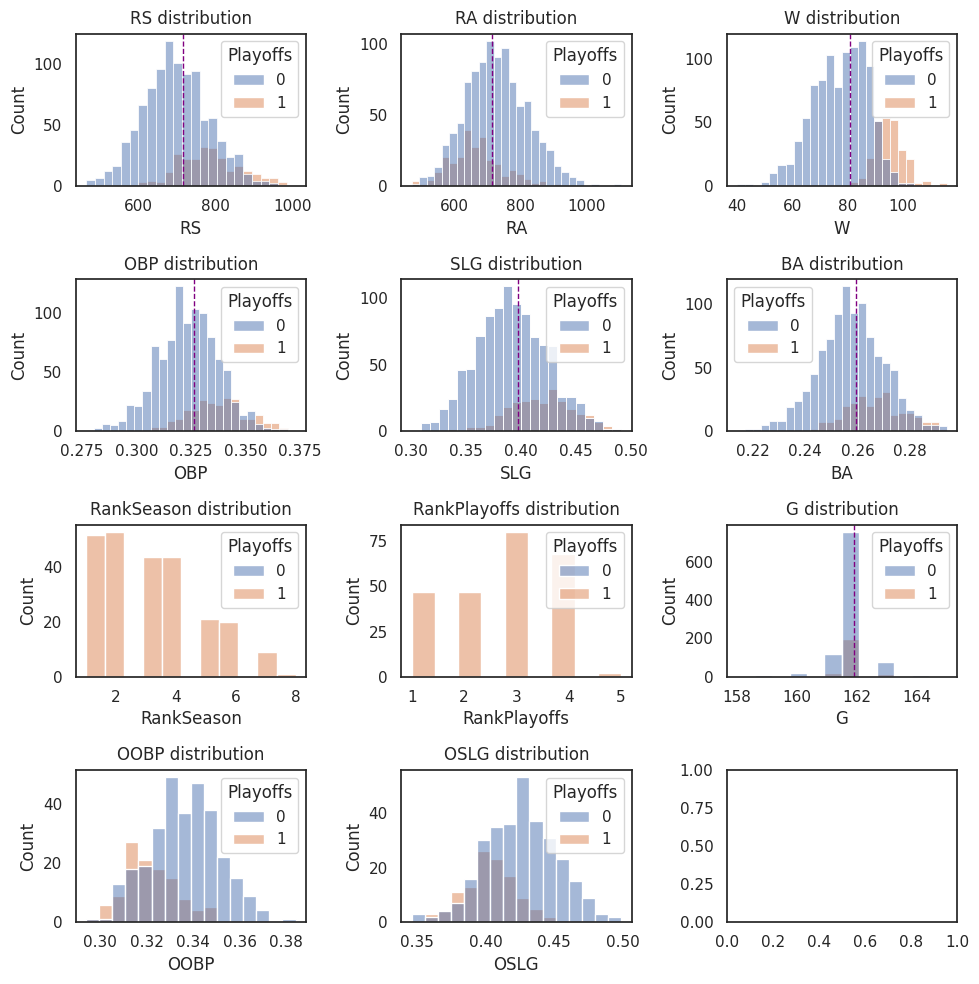

In [302]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(10,10))
fig.subplots_adjust(wspace=0.5, hspace=0.5)

for ax, x in zip(axes.flatten(), selected_cols):
    sns.histplot(x=x, ax=ax, data=df, hue='Playoffs')
    m = df[x].values.mean()
    print(x, m)
    ax.axvline(m, ls='--', linewidth=1, color='purple')
    ax.set_title(f'{x} distribution', pad=7)
    plt.tight_layout()

RS 715.0819805194806
RA 715.0819805194806
W 80.90422077922078
OBP 0.32633116883116886
SLG 0.39734172077922075
BA 0.25927272727272727
RankSeason 3.122950819672131
RankPlayoffs 2.7172131147540983
G 161.91883116883116
OOBP 0.3322642857142856
OSLG 0.41974285714285714


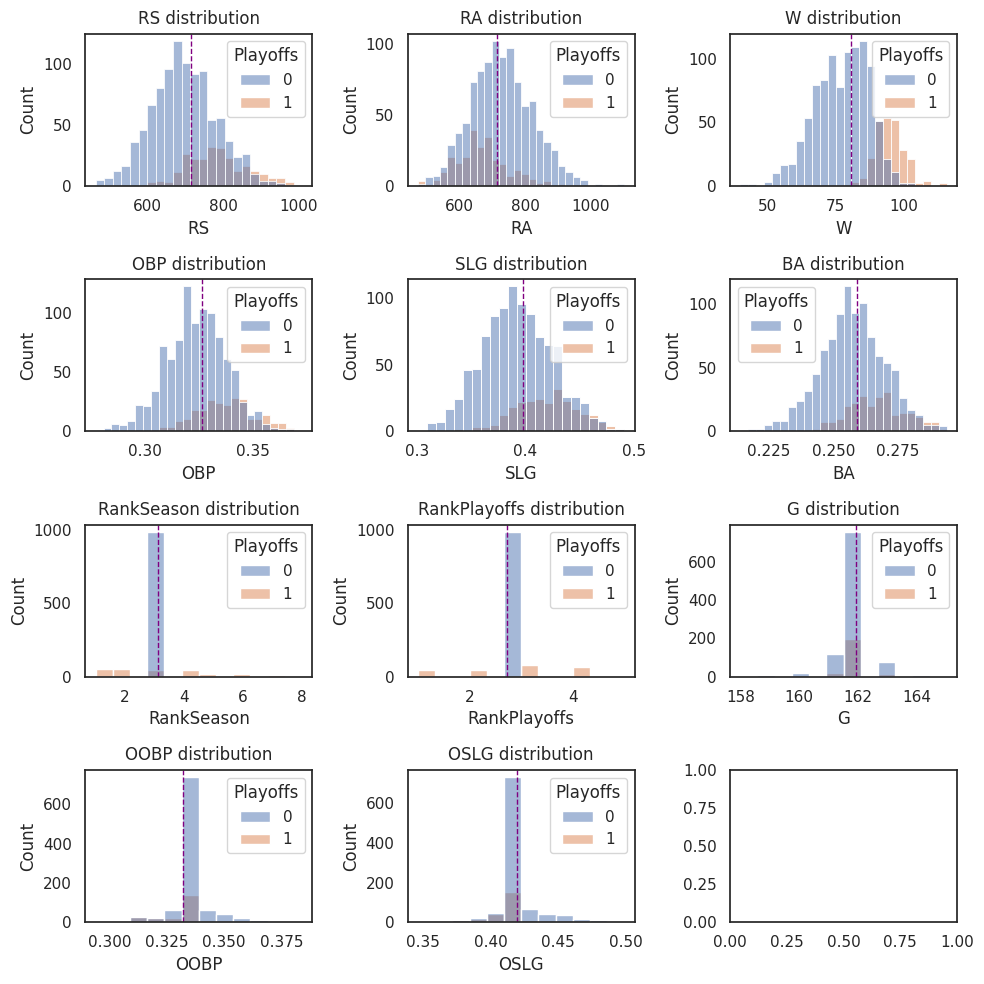

In [252]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(10,10))
fig.subplots_adjust(wspace=0.5, hspace=0.5)

for ax, x in zip(axes.flatten(), selected_cols):
    sns.histplot(x=x, ax=ax, data=df_filled, hue='Playoffs')
    m = df_filled[x].values.mean()
    print(x, m)
    ax.axvline(m, ls='--', linewidth=1, color='purple')
    ax.set_title(f'{x} distribution', pad=7)
    plt.tight_layout()

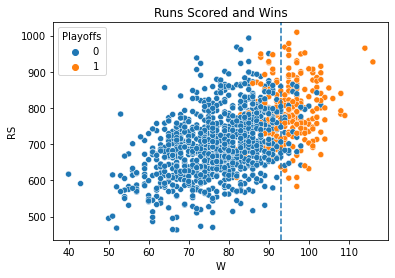

In [22]:
## plt.figure(figsize=(5,3))
sns.scatterplot(data=df, x='W', y='RS', hue='Playoffs').set_title("Runs Scored and Wins")
plt.axvline(x = 93, ls = '--');

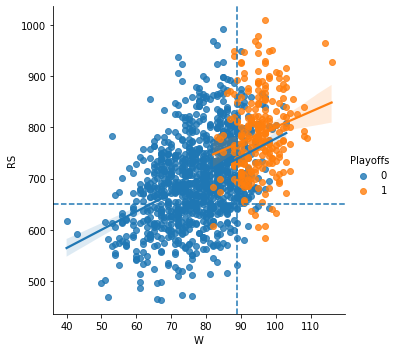

In [21]:
## plt.figure(figsize=(5,3))
sns.lmplot(data=df, x='W', y='RS', hue='Playoffs') #.set_title("Runs Scored and Wins")
plt.axvline(x = 89, ls = '--')
plt.axhline(y = 650, ls = '--');

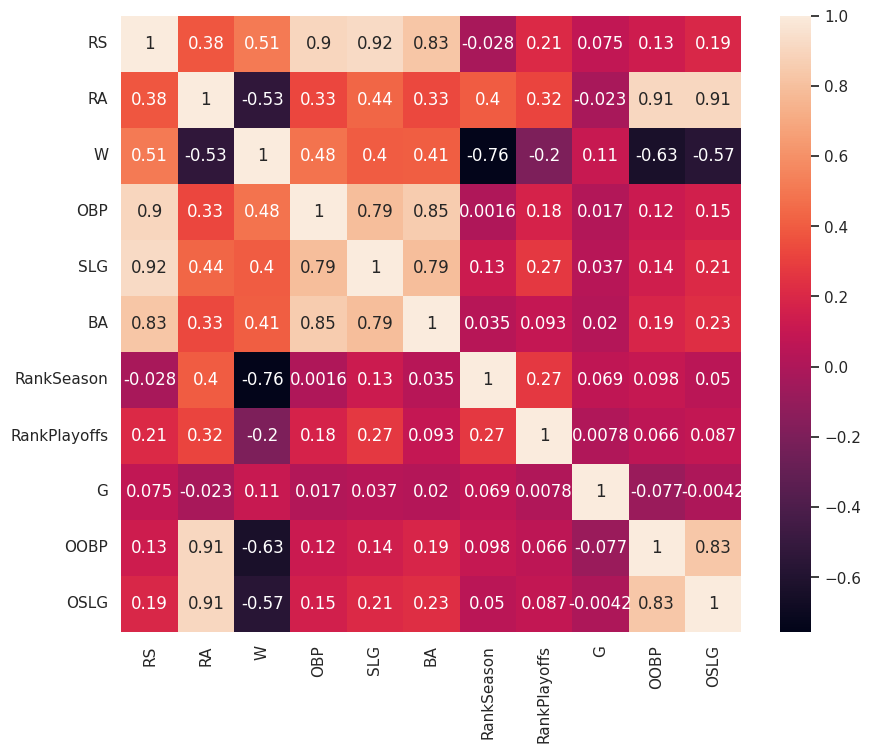

In [273]:
sns.heatmap(df[selected_cols].corr(method='pearson'), annot=True);

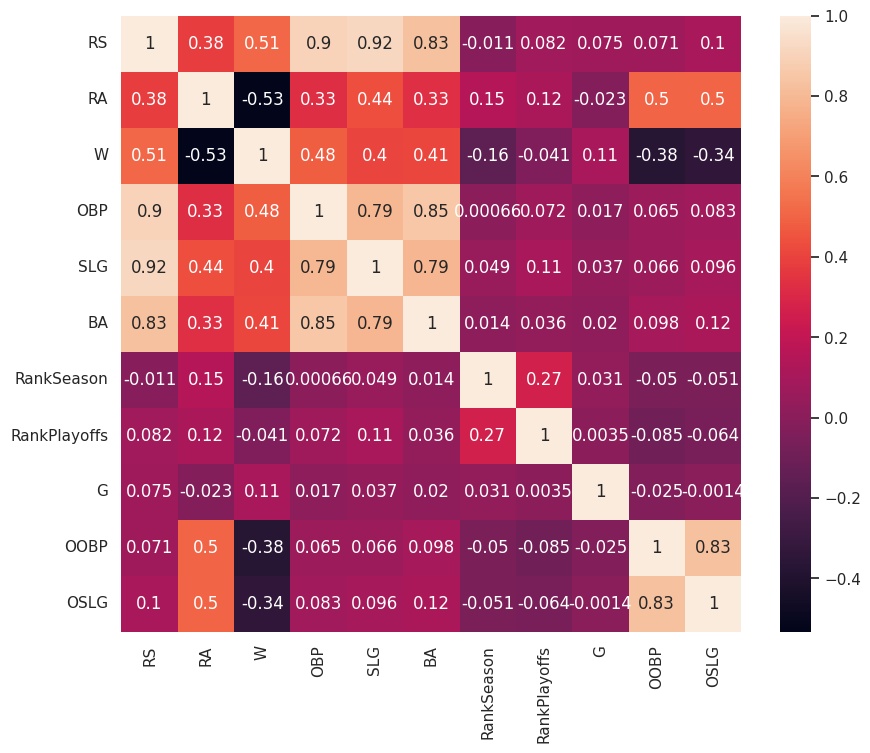

In [274]:
sns.heatmap(df_filled[selected_cols].corr(method='pearson'), annot=True);